<img src = "https://drive.google.com/uc?export=view&id=1wuCtg5UbqCfKDczKQmweW9bgUDSY2t9a" alt = "Encabezado MLDS" width = "100%">  </img>

# **Preparación de los datos**
---

Este notebook es una plantilla que le puede servir como guía para el cuarto entregable del proyecto aplicado.

## **0. Integrantes del equipo de trabajo**
---

1. ---**Eduardo Elias Castellanos Picon CC 1068390127 <eduardoeliascastellanospicon@gmail.com>**---
2. ---**Anthony Joao Parra CC 1073165713 <anthonyjoaoparra@gmail.com>**---
3. ---**Asdrúval Zácipa Corredor CC 79139929 <azacipac@unal.edu.co>**---

## **1. Análisis de calidad de los datos**
---

Describa la estructura y la naturaleza de los datos antes de comenzar con el análisis en profundidad.

### **1.1. Resumen de la calidad de los datos**
---

- ¿Se detecta la ausencia de datos, la presencia de documentos vacíos o la existencia de datos de baja calidad en el conjunto?

Se identifican datos vacios para algunas columnas, para las cuales se toma la decisión de eliminar los registros correspondientes. Esto no se considera impactante para efectos de análisis debido al tamaño del dataset.

- ¿Se identifican documentos ilegibles o con dificultades de codificación durante la revisión del conjunto de datos?

Se identifican datos como la descripción de los nombres que deben ser estandarizados con el fin de permitirnos realizar un visualización a nivel geográfico de los datos como el puntaje máximo en la prueba Saber11 por departamento.

- ¿Se observa una diversidad de formatos en el conjunto de datos que pueda dificultar su consistencia o comprensión?

En los datos revisados no se identifican problemas en el formato de los datos.

- ¿Se identificaron y abordan posibles problemas, como valores atípicos, duplicados o datos faltantes?

Como se indica, para los  datos faltantes se toma la decisión de eliminarlos del dataset. No se identifican valores duplicados ya que el dataset esta identificado por el una variable que corresponde a la identificación única del estudiante que presenta la prueba.

Respecto a datos atípicos, se pueden visualizar en el análisis gráfico. Se realiza eliminación de registros que tienen valor 0 o negativo para las pruebas individuales y la prueba global. Sobre los datos que quedan, se realizará en análisis, ya que se encuentran en el intervalo válido de resultado tanto a nivel de las pruebas individuales como de la prueba global.

## **2. Limpieza de los Datos**
---

La elección de las técnicas de preprocesamiento puede diferir en cada conjunto de datos. Recuerde que es posible aplicar, según sea necesario (no necesariamente todas), las técnicas generales que se han explorado en el curso. La elección dependerá del tipo de datos con el que esté trabajando, ya sea imágenes, datos estructurados, textos, entre otros.

- ¿Cuáles fueron los criterios utilizados para identificar y tratar valores atípicos, datos faltantes o cualquier otra anomalía en el conjunto de datos durante el proceso de limpieza?

En cuanto a datos faltantes se determina no imputarlos y proceder a eliminar esos registros del dataset, los cuales estaban por el orden de un 10% de la cantidad total de registros.

- ¿Cómo se justificaría la necesidad de cada paso de preprocesamiento en términos de mejora de la calidad de los datos y preparación para el análisis subsiguiente?

La limpieza y preparación de los datos nos permiten realizar un análisis de correlación entre una nueva variable categórica que indicará si el estudiante aprueba o no la prueba Saber11. A partir del resultado de éste análisis de correlación, esperamor aplicar técnicas de Machine Learning para generar un modelo de predicción que indique si el estudiante aprobará o no la prueba Saber11.

A continuación se presenta el código correspondiente:

In [1]:
# ---INGRESE SU CÓDIGO---
from pymongo import MongoClient
import json
import pandas as pd
import zipfile
import os
import copy
import numpy as np
import warnings
from pathlib import Path
from IPython.display import display
from pymongoarrow.monkey import patch_all
from pymongoarrow.api import Schema

In [2]:
patch_all() # This function extends PyMongo with the PyMongoArrow methods.

In [3]:
warnings.filterwarnings("ignore") # suprimir mensajes warning

In [4]:
connection_str = "mongodb://localhost:27017/"
client = MongoClient(connection_str)

In [5]:
db = client["icfes_db_mlds"]
print(db)

Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'icfes_db_mlds')


### Limpieza de datos

Realizaremos la actualización de la descripción de columnas de departamento y ciudad que tengan diferencias por acentos. Esto permitirá la generación de mapas coropléticos. Esta limpieza la realizaremos sobre las colecciones en MongoDB.

In [6]:
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'BOGOTA'}}, {'$set':{'ESTU_DEPTO_RESIDE':'BOGOTÁ'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'ATLANTICO'}}, {'$set':{'ESTU_DEPTO_RESIDE':'ATLÁNTICO'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'BOLIVAR'}}, {'$set':{'ESTU_DEPTO_RESIDE':'BOLÍVAR'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'BOYACA'}}, {'$set':{'ESTU_DEPTO_RESIDE':'BOYACÁ'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'CAQUETA'}}, {'$set':{'ESTU_DEPTO_RESIDE':'CAQUETÁ'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'CHOCO'}}, {'$set':{'ESTU_DEPTO_RESIDE':'CHOCÓ'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'CORDOBA'}}, {'$set':{'ESTU_DEPTO_RESIDE':'CÓRDOBA'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'GUAINIA'}}, {'$set':{'ESTU_DEPTO_RESIDE':'GUAINÍA'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'NORTE SANTANDER'}}, {'$set':{'ESTU_DEPTO_RESIDE':'NORTE DE SANTANDER'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'QUINDIO'}}, {'$set':{'ESTU_DEPTO_RESIDE':'QUINDÍO'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'SAN ANDRES'}}, {'$set':{'ESTU_DEPTO_RESIDE':'SAN ANDRÉS Y PROVIDENCIA'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'VALLE'}}, {'$set':{'ESTU_DEPTO_RESIDE':'VALLE DEL CAUCA'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_RESIDE':{'$eq':'VAUPES'}}, {'$set':{'ESTU_DEPTO_RESIDE':'VAUPÉS'}})
#
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'BOGOTA'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'BOGOTÁ'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'ATLANTICO'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'ATLÁNTICO'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'BOLIVAR'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'BOLÍVAR'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'BOYACA'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'BOYACÁ'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'CAQUETA'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'CAQUETÁ'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'CHOCO'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'CHOCÓ'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'CORDOBA'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'CÓRDOBA'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'GUAINIA'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'GUAINÍA'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'NORTE SANTANDER'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'NORTE DE SANTANDER'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'QUINDIO'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'QUINDÍO'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'SAN ANDRES'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'SAN ANDRÉS Y PROVIDENCIA'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'VALLE'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'VALLE DEL CAUCA'}})
db.icfes_estudiante_estudiante.update_many({'ESTU_DEPTO_PRESENTACION':{'$eq':'VAUPES'}}, {'$set':{'ESTU_DEPTO_PRESENTACION':'VAUPÉS'}})

UpdateResult({'n': 2245, 'nModified': 2245, 'ok': 1.0, 'updatedExisting': True}, acknowledged=True)

In [7]:
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'BOGOTA'}}, {'$set':{'COLE_DEPTO_UBICACION':'BOGOTÁ'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'ATLANTICO'}}, {'$set':{'COLE_DEPTO_UBICACION':'ATLÁNTICO'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'BOLIVAR'}}, {'$set':{'COLE_DEPTO_UBICACION':'BOLÍVAR'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'BOYACA'}}, {'$set':{'COLE_DEPTO_UBICACION':'BOYACÁ'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'CAQUETA'}}, {'$set':{'COLE_DEPTO_UBICACION':'CAQUETÁ'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'CHOCO'}}, {'$set':{'COLE_DEPTO_UBICACION':'CHOCÓ'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'CORDOBA'}}, {'$set':{'COLE_DEPTO_UBICACION':'CÓRDOBA'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'GUAINIA'}}, {'$set':{'COLE_DEPTO_UBICACION':'GUAINÍA'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'NORTE SANTANDER'}}, {'$set':{'COLE_DEPTO_UBICACION':'NORTE DE SANTANDER'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'QUINDIO'}}, {'$set':{'COLE_DEPTO_UBICACION':'QUINDÍO'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'SAN ANDRES'}}, {'$set':{'COLE_DEPTO_UBICACION':'SAN ANDRÉS Y PROVIDENCIA'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'VALLE'}}, {'$set':{'COLE_DEPTO_UBICACION':'VALLE DEL CAUCA'}})
db.icfes_estudiante_colegio.update_many({'COLE_DEPTO_UBICACION':{'$eq':'VAUPES'}}, {'$set':{'COLE_DEPTO_UBICACION':'VAUPÉS'}})

UpdateResult({'n': 2242, 'nModified': 2242, 'ok': 1.0, 'updatedExisting': True}, acknowledged=True)

Validación colección icfes_estudiante_estudiante

In [9]:
def query_agg_dataframe(collection, match, project, group, sort):
    """"
    Función read_zip_file: Realiza la extracción de los datos de cada archivo zip y devuelve un dataframe por cada uno de los archivos TXT
    
    Parámetros:
        filanema(string): Nombre del archivo a analizar incluyendo la ruta de ubicación del mismo
    
    Return:
        df   (dataframe): Dataframe con los datos del archivo procesado
    
    Ejemplo:
    
        >>> df = read_zip_file(filename = './data/input/ResultadosSaber11_2027_2022_Fte_ICFES/SB11_20171.zip')
            
            *** processing filename ./data/input/ResultadosSaber11_2027_2022_Fte_ICFES/SB11_20171.zip
              zipfile SB11_20171.TXT
    """
    flag_aggr = True
    if (len(sort['$sort']) == 0):
        if (len(group['$group']) == 0):
            pipeline = [match, project]
            flag_aggr = False
        else:
            pipeline = [match, group, project]
    else:
        pipeline = [match, group, project, sort]
    #print("pipeline",pipeline)
    if (flag_aggr):
        df = collection.aggregate_pandas_all(pipeline)
    else:
        df = collection.find_pandas_all(match['$match'])
    return df

In [10]:
# Verificar diferencias en descripcion de departamentos
match = {"$match": {}}
project = {'$project': {
            '_id' : 0,
            'COD_DEPTO': '$_id.COD_DEPTO',
            'DEPTO': '$_id.DEPTO',
            'CANTIDAD': '$CANTIDAD',
            'MAXIMO': '$MAXIMO'
        }}

group = {'$group': {'_id':{'DEPTO':'$ESTU_DEPTO_RESIDE', 'COD_DEPTO':'$ESTU_COD_RESIDE_DEPTO'}
                    , 'CANTIDAD': {'$sum': 1}, 'MAXIMO':{'$max':'$PUNTAJE.PUNT_GLOBAL'}}}
sort = {'$sort': {"DEPTO": -1}}
df_query = query_agg_dataframe(db["icfes_estudiante_estudiante"], match, project, group, sort)

In [11]:
df_query

,COD_DEPTO,DEPTO,CANTIDAD,MAXIMO
0,99.0,VICHADA,3231,390
1,97.0,VAUPÉS,2189,403
2,76.0,VALLE DEL CAUCA,277989,495
3,73.0,TOLIMA,98807,492
4,70.0,SUCRE,64378,476
5,68.0,SANTANDER,151538,478
6,88.0,SAN ANDRÉS Y PROVIDENCIA,3709,409
7,66.0,RISARALDA,61722,469
8,63.0,QUINDÍO,37945,477
9,86.0,PUTUMAYO,24264,432


Se eliminan los que tienen el valor ESTU_DEPTO_RESIDE en None. Primero sacamos los ESTU_CONSECUTIVO para borrarlos de todas las colecciones y dejar consistente los datos

In [12]:
from pymongoarrow.api import Schema
def query_into_dataframe(collection, match, projection, schema):
    """"
    Función query_into_dataframe: Ejecutar consulta sobre la colección que se indica y devolver el resultado en 
                                  un dataframe
    
    Parámetros:
        collection (string): Nombre de la colección sobre la cual se realizará la consulta
        match      (string): Condicion de filtro de la consulta
        projection (string): Mapeo de columnas a retornar en la consulta
        schema     (string): Mapeo de tipos de dato de las columnas a retornar en la consulta
    
    Return:
        df   (dataframe): Dataframe con el resultado de la consulta
    
    Ejemplo:
    
        >>> df_null_estu_depto_reside = query_into_dataframe(collection, match, projection, schema)
    """
    schema = Schema(schema)
    df = collection.find_pandas_all(match['$match'], projection = projection, schema=schema)
    return df

In [13]:
#leer tabla con datos agregados
match = {"$match": {"ESTU_COD_RESIDE_DEPTO":np.nan}}
projection = {'ESTU_CONSECUTIVO':'$ESTU_CONSECUTIVO'
          ,'ESTU_COD_RESIDE_DEPTO':'$ESTU_COD_RESIDE_DEPTO'
          ,'ESTU_DEPTO_RESIDE':'$ESTU_DEPTO_RESIDE'
          ,'PUNTAJE':'$PUNTAJE.PUNT_GLOBAL'}
schema = {'ESTU_CONSECUTIVO': str
          ,'ESTU_COD_RESIDE_DEPTO': int
          ,'ESTU_DEPTO_RESIDE': str
          ,'PUNTAJE': int
        }

df_null_estu_depto_reside = query_into_dataframe(db["icfes_estudiante_estudiante"], match, projection, schema)

In [14]:
df_null_estu_depto_reside

,ESTU_CONSECUTIVO,ESTU_COD_RESIDE_DEPTO,ESTU_DEPTO_RESIDE,PUNTAJE
0,SB11201720608650,NaN,None,266
1,SB11201720608678,NaN,None,232
2,SB11201720608679,NaN,None,243
3,SB11201720608618,NaN,None,262
4,SB11201720608613,NaN,None,324
...,...,...,...,...
1721,SB11202140432305,NaN,None,165
1722,SB11202140433702,NaN,None,199
1723,SB11202210084642,NaN,None,294
1724,SB11202210084672,NaN,None,215


Validación colección icfes_estudiante_colegio

In [15]:
# Verificar diferencias en descripcion de departamentos
match = {"$match": {}}
project = {'$project': {
            '_id' : 0,
            'DEPTO': '$_id.DEPTO',
            'CANTIDAD': '$CANTIDAD',
            'MAXIMO': '$MAXIMO'
        }}

group = {'$group': {'_id':{'DEPTO':'$COLE_DEPTO_UBICACION'}, 'CANTIDAD': {'$sum': 1}, 'MAXIMO':{'$max':'$PUNTAJE.PUNT_GLOBAL'}}}
sort = {'$sort': {"DEPTO": -1}}
df_query = query_agg_dataframe(db["icfes_estudiante_colegio"], match, project, group, sort)

In [16]:
df_query

,DEPTO,CANTIDAD,MAXIMO
0,VICHADA,3206,390
1,VAUPÉS,2242,403
2,VALLE DEL CAUCA,277898,495
3,TOLIMA,98144,492
4,SUCRE,64252,476
5,SANTANDER,153400,478
6,SAN ANDRÉS Y PROVIDENCIA,3647,409
7,RISARALDA,62069,469
8,QUINDÍO,38187,477
9,PUTUMAYO,24193,432


In [17]:
match = {"$match": {"COLE_COD_DEPTO_UBICACION":np.nan}}
projection = {'ESTU_CONSECUTIVO':'$ESTU_CONSECUTIVO'
          ,'COLE_COD_DEPTO_UBICACION':'$COLE_COD_DEPTO_UBICACION'
          ,'COLE_DEPTO_UBICACION':'$COLE_DEPTO_UBICACION'
          ,'PUNTAJE':'$PUNTAJE.PUNT_GLOBAL'}
schema = {'ESTU_CONSECUTIVO': str
          ,'COLE_COD_DEPTO_UBICACION': int
          ,'COLE_DEPTO_UBICACION': str
          ,'PUNTAJE': int
        }

df_null_cole_depto_reside = query_into_dataframe(db["icfes_estudiante_colegio"], match, projection, schema)

In [18]:
df_null_cole_depto_reside

,ESTU_CONSECUTIVO,COLE_COD_DEPTO_UBICACION,COLE_DEPTO_UBICACION,PUNTAJE
0,SB11202240550499,NaN,None,192


Procedemos a eliminar estos registros de todas las colecciones

In [19]:
from pymongoarrow.api import Schema
def delete_from_list(collection, column_name, df):
    """"
    Función delete_from_list: Borrar registros de una coleccion segun la lista de valores que se indica
    
    Parámetros:
        collection (string): Nombre de la colección sobre la cual se realizará la consulta
        column_name(string): Columna sobre cual se determinaran los valores correspondientes a los registros 
                             a borrar
        df      (Dataframe): Dataframe que contiene la columna con las llaves de los registros de la coleccion 
                             a borrar
    
    Return:
        count         (int): Cantidad de los registros borrados
    
    Ejemplo:
    
        >>> df_null_estu_depto_reside = query_into_dataframe(collection, match, projection, schema)
    """
    del_list = df[column_name].tolist()
    del_query = {
                    column_name: 
                    {
                        "$in": del_list
                    }
                }
    result   = collection.delete_many(del_query)
    return result.deleted_count

Borrar los nulos de COLE_DEPTO_RESIDE (1 documento)

In [20]:
print('Documentos borrados:', delete_from_list(collection = db["icfes_estudiante_colegio"]
                                               , column_name = 'ESTU_CONSECUTIVO', df = df_null_cole_depto_reside))
print('Documentos borrados:', delete_from_list(collection = db["icfes_estudiante_estudiante"]
                                               , column_name = 'ESTU_CONSECUTIVO', df = df_null_cole_depto_reside))
print('Documentos borrados:', delete_from_list(collection = db["icfes_estudiante_familia"]
                                               , column_name = 'ESTU_CONSECUTIVO', df = df_null_cole_depto_reside))

Documentos borrados: 1
Documentos borrados: 1
Documentos borrados: 1


Borrar los nulos de ESTU_COD_RESIDE_DEPTO (1726 documentos)

In [21]:
print('Documentos borrados:', delete_from_list(collection = db["icfes_estudiante_colegio"]
                                               , column_name = 'ESTU_CONSECUTIVO', df = df_null_estu_depto_reside))
print('Documentos borrados:', delete_from_list(collection = db["icfes_estudiante_estudiante"]
                                               , column_name = 'ESTU_CONSECUTIVO', df = df_null_estu_depto_reside))
print('Documentos borrados:', delete_from_list(collection = db["icfes_estudiante_familia"]
                                               , column_name = 'ESTU_CONSECUTIVO', df = df_null_estu_depto_reside))

Documentos borrados: 1726
Documentos borrados: 1726
Documentos borrados: 1726


Verificar que no hay nulos en código de departamento

In [22]:
#validar nulos en ESTU_COD_RESIDE_DEPTO
match = {"$match": {"ESTU_COD_RESIDE_DEPTO":np.nan}}
projection = {'ESTU_CONSECUTIVO':'$ESTU_CONSECUTIVO'
          ,'ESTU_COD_RESIDE_DEPTO':'$ESTU_COD_RESIDE_DEPTO'
          ,'ESTU_DEPTO_RESIDE':'$ESTU_DEPTO_RESIDE'
          ,'PUNTAJE':'$PUNTAJE.PUNT_GLOBAL'}
schema = {'ESTU_CONSECUTIVO': str
          ,'ESTU_COD_RESIDE_DEPTO': int
          ,'ESTU_DEPTO_RESIDE': str
          ,'PUNTAJE': int
        }

query_into_dataframe(db["icfes_estudiante_estudiante"], match, projection, schema)

,ESTU_CONSECUTIVO,ESTU_COD_RESIDE_DEPTO,ESTU_DEPTO_RESIDE,PUNTAJE


In [24]:
#validar nulos en COLE_COD_DEPTO_UBICACION
match = {"$match": {"COLE_COD_DEPTO_UBICACION":np.nan}}
projection = {'ESTU_CONSECUTIVO':'$ESTU_CONSECUTIVO'
          ,'COLE_COD_DEPTO_UBICACION':'$COLE_COD_DEPTO_UBICACION'
          ,'COLE_DEPTO_UBICACION':'$COLE_DEPTO_UBICACION'
          ,'PUNTAJE':'$PUNTAJE.PUNT_GLOBAL'}
schema = {'ESTU_CONSECUTIVO': str
          ,'COLE_COD_DEPTO_UBICACION': int
          ,'COLE_DEPTO_UBICACION': str
          ,'PUNTAJE': int
        }

query_into_dataframe(db["icfes_estudiante_colegio"], match, projection, schema)

,ESTU_CONSECUTIVO,COLE_COD_DEPTO_UBICACION,COLE_DEPTO_UBICACION,PUNTAJE


Verificar que el número de documentos en cada colección sea el mismo

In [25]:
print('Cantidad de documentos en icfes_estudiante_colegio   : ', db["icfes_estudiante_colegio"].count_documents({}))
print('Cantidad de documentos en icfes_estudiante_estudiante: ', db["icfes_estudiante_estudiante"].count_documents({}))
print('Cantidad de documentos en icfes_estudiante_familia   : ', db["icfes_estudiante_familia"].count_documents({}))

Cantidad de documentos en icfes_estudiante_colegio   :  3314452
Cantidad de documentos en icfes_estudiante_estudiante:  3314452
Cantidad de documentos en icfes_estudiante_familia   :  3314452


Determinar y eliminar puntajes en cero o negativos

In [27]:
#validar puntajes en cero o negativos
match = {"$match": {"PUNTAJE.PUNT_GLOBAL":{"$lte": 0}}}
projection = {'ESTU_CONSECUTIVO':'$ESTU_CONSECUTIVO'
          ,'PUNTAJE':'$PUNTAJE.PUNT_GLOBAL'}
schema = {'ESTU_CONSECUTIVO': str
          ,'PUNTAJE': int
        }

df_puntaje_cero = query_into_dataframe(db["icfes_estudiante_colegio"], match, projection, schema)

In [28]:
df_puntaje_cero

,ESTU_CONSECUTIVO,PUNTAJE
0,SB11201720303943,0
1,SB11201720086239,0
2,SB11201820522371,0
3,SB11201820119331,0
4,SB11201820571399,0
...,...,...
96,SB11202140318314,0
97,SB11202240208463,0
98,SB11202240615832,0
99,SB11202240305324,0


In [29]:
# Se eliminan los 101 documentos con valor 0 en el puntaje global
print('Documentos borrados:', delete_from_list(collection = db["icfes_estudiante_colegio"]
                                               , column_name = 'ESTU_CONSECUTIVO', df = df_puntaje_cero))
print('Documentos borrados:', delete_from_list(collection = db["icfes_estudiante_estudiante"]
                                               , column_name = 'ESTU_CONSECUTIVO', df = df_puntaje_cero))
print('Documentos borrados:', delete_from_list(collection = db["icfes_estudiante_familia"]
                                               , column_name = 'ESTU_CONSECUTIVO', df = df_puntaje_cero))

Documentos borrados: 101
Documentos borrados: 101
Documentos borrados: 101


In [30]:
#validar puntajes en cero o negativos
match = {"$match": {"PUNTAJE.PUNT_GLOBAL":{"$lte": 0}}}
projection = {'ESTU_CONSECUTIVO':'$ESTU_CONSECUTIVO'
          ,'PUNTAJE':'$PUNTAJE.PUNT_GLOBAL'}
schema = {'ESTU_CONSECUTIVO': str
          ,'PUNTAJE': int
        }

query_into_dataframe(db["icfes_estudiante_estudiante"], match, projection, schema)

,ESTU_CONSECUTIVO,PUNTAJE


### Visualización de los datos

Para efectos de realizar un análisis gráfico de los datos, vamos a realizar la generación de mapas coropléticos con la distribución a nivel país y a nivel Bogotá de los máximos puntajes obtenidos por los estudiantes.

En primer lugar, realizaremos una consulta sobre las colecciones agrupando por departamento de residencia del estudiante, con el fin de representar la distribución de los puntajes máximos por departamento.

In [31]:
# Generar dataframe con datos agregados
match = {"$match": {}}
project = {'$project': {
            '_id' : 0,
            'DEPTO': '$_id.DEPTO',
            'CANTIDAD': '$CANTIDAD',
            'MAXIMO': '$MAXIMO'
        }}

group = {'$group': {'_id':{'DEPTO':'$ESTU_DEPTO_RESIDE'}, 'CANTIDAD': {'$sum': 1}, 'MAXIMO':{'$max':'$PUNTAJE.PUNT_GLOBAL'}}}
sort = {'$sort': {"CANTIDAD": -1}}
df_icfes_estudiante_estudiante_aggr = query_agg_dataframe(db["icfes_estudiante_estudiante"], match, project, group, sort)

In [32]:
df_icfes_estudiante_estudiante_aggr

,DEPTO,CANTIDAD,MAXIMO
0,BOGOTÁ,518248,479
1,ANTIOQUIA,441155,477
2,VALLE DEL CAUCA,277981,495
3,CUNDINAMARCA,214850,477
4,ATLÁNTICO,191199,500
5,BOLÍVAR,155104,475
6,SANTANDER,151535,478
7,CÓRDOBA,122795,473
8,NARIÑO,101937,472
9,TOLIMA,98803,492


Con ayuda de una fuente de datos que contiene información de polígonos y utilizando Geopandas, vamos a construir un dataframe consolidado con éstos datos.

In [34]:
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt

In [35]:
departamentos_gdf = gpd.read_file('departamentos.json')
cols = ['DEPTO','REGION','AREA','PERIMETRO','POB_CABECERA','POB_RESTO','POB_TOTAL','GEOMETRY']
departamentos_gdf.columns = cols
departamentos_gdf.head()

,DEPTO,REGION,AREA,PERIMETRO,POB_CABECERA,POB_RESTO,POB_TOTAL,GEOMETRY
0,ANTIOQUIA,Región Eje Cafetero - Antioquia,6.335186e+10,1963728.843,5281409,1396521,6677930,"POLYGON ((-76.30730 8.61930, -76.29810 8.61640..."
1,ATLÁNTICO,Región Caribe,3.360765e+09,240936.172,2282828,139300,2722128,"POLYGON ((-74.87060 10.36120, -74.87640 10.343..."
2,BOGOTÁ,Región Centro Oriente,1.650948e+09,323322.540,7715778,28177,7743955,"POLYGON ((-74.02290 4.79510, -74.02640 4.78360..."
3,BOLÍVAR,Región Caribe,2.614189e+10,1309427.968,1618648,562328,2180976,"POLYGON ((-75.15950 10.42360, -75.15430 10.409..."
4,BOYACÁ,Región Centro Oriente,2.335258e+10,1364539.911,736624,506107,1242731,"POLYGON ((-72.21300 7.02750, -72.20610 7.02460..."


Se crea nuevo dataframe con el merge entre el dataframe con las cantidades y puntajes máximos, y el dataframe que tiene los datos de georeferencia. El cruce se realiza por el nombre del departamento.

In [190]:
df_merge = df_icfes_estudiante_estudiante_aggr.merge(departamentos_gdf.drop_duplicates(), on=['DEPTO'], how='outer', indicator=True)

In [192]:
# crear dataframe de geopandas con los datos del dataframe combinado
columns = ['DEPTO','CANTIDAD','MAXIMO','geometry']
plot_departamentos_gdf = gpd.GeoDataFrame(df_merge, geometry=df_merge.GEOMETRY)[columns]
columns = ['Departamento','Cantidad Estudiantes','Puntaje Maximo','geometry']
plot_departamentos_gdf.columns = columns

In [193]:
# creamos indice sobre el dataframe por la columna DEPTO
plot_departamentos_gdf = plot_departamentos_gdf.set_index("Departamento")
plot_departamentos_gdf = plot_departamentos_gdf.drop('EXTRANJERO')

Con lo cual el mapa generado con la distribución de los máximos puntajes globales en la prueba Saber11 por departamento es:

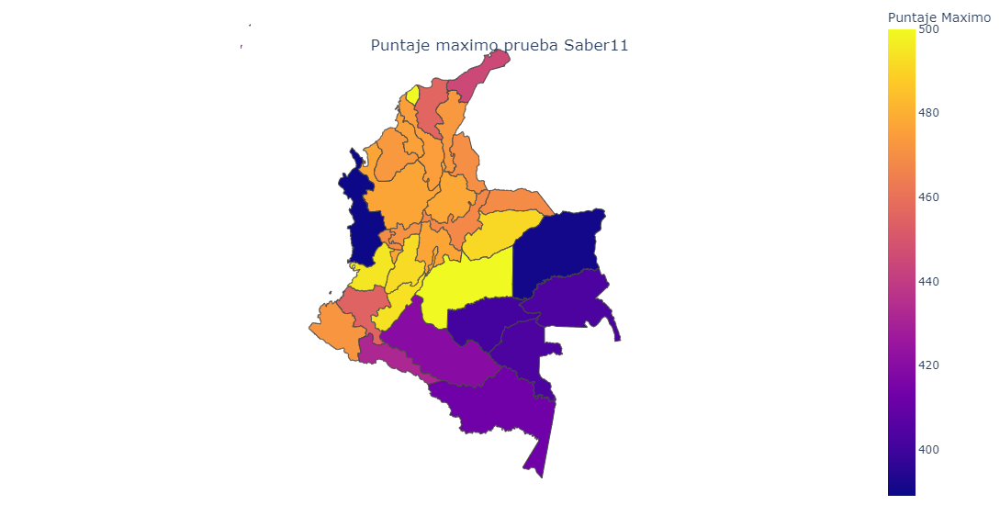

In [194]:
import plotly.express as px
import geopandas as gpd

fig = px.choropleth(plot_departamentos_gdf,
                   geojson=plot_departamentos_gdf.geometry,
                   locations=plot_departamentos_gdf.index,
                   color="Puntaje Maximo",
                   projection="mercator"
                   )

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    title=dict(
        text="Puntaje maximo prueba Saber11",
        xanchor='center',
        x=0.5,
        yref='paper',
        yanchor='bottom',
        y=0.9,
        pad={'b': 0}
    ),
    margin={'r': 0, 't': 0, 'l': 0, 'b': 0},
    height=550,
    width=450
)
fig.show()

Para la generación del mapa de distribución del puntaje global en la ciudad de Bogotá, utilizaremos un dataset que contiene los datos de georeferencia para las diferentes localidades de la ciudad.

In [93]:
bogota_gdf = gpd.read_file('localidadesBogota.json')
bogota_gdf = bogota_gdf.astype({col: 'int16' for col in ['LocCodigo']})
cols = ['OBJECTID','NOM_LOCALIDAD','LOCAADNMINI','LOCAREA','COD_LOCALIDAD','SHAPE_LENGTH','SHAPE_AREA','GEOMETRY']
bogota_gdf.columns = cols
bogota_gdf.head()

,OBJECTID,NOM_LOCALIDAD,LOCAADNMINI,LOCAREA,COD_LOCALIDAD,SHAPE_LENGTH,SHAPE_AREA,GEOMETRY
0,81,ANTONIO NARIÑO,Acuerdo 117 de 2003,4.879543e+06,15,0.108973,0.000397,"POLYGON ((-74.13075 4.59335, -74.12917 4.59327..."
1,82,TUNJUELITO,Acuerdo 117 de 2003,9.910940e+06,6,0.210542,0.000807,"POLYGON ((-74.13777 4.59489, -74.13165 4.59363..."
2,83,RAFAEL URIBE URIBE,Acuerdo 117 de 2003,1.383408e+07,18,0.174513,0.001126,"POLYGON ((-74.12803 4.59254, -74.12777 4.59233..."
3,84,CANDELARIA,Acuerdo 117 de 2003,2.060243e+06,17,0.067158,0.000168,"POLYGON ((-74.06621 4.60317, -74.06620 4.60317..."
4,85,BARRIOS UNIDOS,Acuerdo 8 de 1977,1.190345e+07,12,0.121180,0.000969,"POLYGON ((-74.05725 4.68684, -74.06249 4.65594..."


Desde la base de datos NoSQL, realizaremos mediante una vista la unión de las colecciones ICFES_COLEGIOS_BOOGOTA y ICFES_ESTUDIANTE_COLEGIO, con el fin de extraer los datos agrupados por localidad y además filtrados para la ciudad de Bogotá.

In [94]:
# leer datos de los colegios de bogota
match = {"$match": {"JORNADA" : "MAÑANA"}}
projection = {'COD_LOCALIDAD': '$COD_LOCALIDAD'
          ,'COD_DANE': '$COD_DANE'
          ,'NOM_LOCALIDAD': '$NOM_LOCALIDAD'
          ,'NOM_COLEGIO': '$NOM_COLEGIO'
        }
schema = {'COD_LOCALIDAD': int
          ,'COD_DANE': int
          ,'NOM_LOCALIDAD': str
          ,'NOM_COLEGIO': str
        }

df_cole_bogota = query_into_dataframe(db["icfes_colegios_bogota"], match, projection, schema)

In [95]:
df_cole_bogota

,COD_LOCALIDAD,COD_DANE,NOM_LOCALIDAD,NOM_COLEGIO
0,1,111001000132,USAQUEN,COLEGIO AQUILEO PARRA (IED)
1,1,111001029955,USAQUEN,COLEGIO AGUSTIN FERNANDEZ (IED)
2,1,111848000244,USAQUEN,COLEGIO AGUSTIN FERNANDEZ (IED)
3,1,111848003456,USAQUEN,COLEGIO AGUSTIN FERNANDEZ (IED)
4,1,111001044806,USAQUEN,COLEGIO FRIEDRICH NAUMANN (IED)
...,...,...,...,...
2547,20,211850001091,SUMAPAZ,COLEGIO GIMNASIO DEL CAMPO JUAN DE LA CRUZ VAR...
2548,20,211850001040,SUMAPAZ,COLEGIO GIMNASIO DEL CAMPO JUAN DE LA CRUZ VAR...
2549,20,211850001058,SUMAPAZ,COLEGIO GIMNASIO DEL CAMPO JUAN DE LA CRUZ VAR...
2550,20,211850000817,SUMAPAZ,COLEGIO GIMNASIO DEL CAMPO JUAN DE LA CRUZ VAR...


In [96]:
# generar dataframe con datos sumarizados por colegio para Bogotá
match =  {"$match": {"COLE_DEPTO_UBICACION": 'BOGOTÁ'}}
project = {'$project': {
            '_id' : 0,
            'DEPTO': '$_id.DEPTO',
            'COD_DANE': '$_id.COLE_COD_DANE',
            'COLE_NOMBRE': '$_id.COLE_NOMBRE',
            'CANTIDAD': '$CANTIDAD',
            'MAXIMO': '$MAXIMO'
        }}

group = {'$group': {'_id':{'DEPTO':'$COLE_DEPTO_UBICACION', 'COLE_COD_DANE':'$COLE_COD_DANE_ESTABLECIMIENTO', 'COLE_NOMBRE':'$COLE_NOMBRE_ESTABLECIMIENTO'}
                    , 'CANTIDAD': {'$sum': 1}, 'MAXIMO':{'$max':'$PUNTAJE.PUNT_GLOBAL'}}}
sort = {'$sort': {"CANTIDAD": -1}}
df_cole_bogota_aggr = query_agg_dataframe(db["icfes_estudiante_colegio"], match, project, group, sort)

In [97]:
df_cole_bogota_aggr

,DEPTO,COD_DANE,COLE_NOMBRE,CANTIDAD,MAXIMO
0,BOGOTÁ,111001024732,COLEGIO INEM FRANCISCO DE PAULA SANTANDER (IED),3236,404
1,BOGOTÁ,111001030015,COLEGIO ENRIQUE OLAYA HERRERA (IED),2321,388
2,BOGOTÁ,111001107875,COLEGIO CIUDADELA EDUCATIVA DE BOSA (IED),2298,398
3,BOGOTÁ,111001011819,COLEGIO LICEO FEMENINO MERCEDES NARIÑO (IED),2282,465
4,BOGOTÁ,111001010031,COLEGIO CEDID SAN PABLO (IED),2208,403
...,...,...,...,...,...
1747,BOGOTÁ,311001800154,INSTITUTO NORTE,3,233
1748,BOGOTÁ,311001104620,COLEGIO CAPACITACION 2000,3,278
1749,BOGOTÁ,311001075361,COLEGIO PSICOPEDAGOGICO AMERICANO DEL SUR,2,274
1750,BOGOTÁ,311001008540,COLEGIO SIGLO XXI,1,260


Crearemos una colección con el anterior dataframe con el fin de crear sobre ella una vista para cruzar con la colección de colegios de Bogotá y asignar el código de localidad a cada colegio con su cantidad de estudiantes que presentan la prueba y el puntaje máximo obtenido por colegio

In [98]:
def create_collection(collection, db):
    """"
    Función create_collection: Permite borrar y crear una colección en la base de datos
    
    Parámetros:
        collection   (string): Nombre de la colección a crear. Si existe previamente es borrada previo a la creación
        df (Database MongoDB): Identificador de la base de datos
    
    Return:
        collection (Collection MongoDB): Identificador de la colección creada en la base de datos
    
    Ejemplo:
    
        >>> icfes_estudiante_resultado  = create_collection("icfes_estudiante_resultado", db)
            
            *** creating collection icfes_estudiante_resultado
            done
    """
    print("*** creating collection", collection)
    db.drop_collection(collection)
    collection = db[collection]
    print("done")
    return collection

In [99]:
def load_collection(df, collection, columns, db):
    """"
    Función load_collection: Realiza la inserción de documentos en la colección que se indica a partir de un DataFrame Pandas
    
    Parámetros:
        df                  (Dataframe): Nombre del Dataframe con los datos a insertar como documentos en la colección
        collection (Collection MongoDB): Nombre de la colección sobre la cual se realizará la carga de los documentos
        columns                  (List): Lista de columnas a extraer del dataframe de entrada para generar los documentos a cargar en la colección
        db           (Database MongoDB): Identificador de la base de datos
    
    Return:
        None
    
    Ejemplo:
    
        >>> load_collection(dict_of_df[name_df], icfes_estudiante_resultado, columns, db)
            
            *** loading collection Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'icfes_db_mlds')
            , 'icfes_estudiante_resultado')
            done
    """
    print("*** loading collection", collection)
    df_tmp = df[columns]
    df_tmp.reset_index(inplace=True)
    data_dict = df_tmp.to_dict("records")
    collection.insert_many(data_dict)
    print("done")
    return None

In [100]:
# creamos una coleccion con este resultado
db.drop_collection("icfes_colegio_bogota_aggr")
icfes_colegio_bogota_aggr = create_collection("icfes_colegio_bogota_aggr", db)
load_collection(df_cole_bogota_aggr, icfes_colegio_bogota_aggr, list(df_cole_bogota_aggr.columns), db)
db.icfes_colegio_bogota_aggr.create_index( { "DEPTO": 1 , "COLE_COD_DANE": 1} )

*** creating collection icfes_colegio_bogota_aggr
done
*** loading collection Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'icfes_db_mlds'), 'icfes_colegio_bogota_aggr')
done


'DEPTO_1_COLE_COD_DANE_1'

Creamos una vista para complementar la localidad, esto con el fin de simular en la base de datos MongoDB el join entre dos colecciones.

In [101]:
db.drop_collection("view_icfes_colegio_bogota_aggr")

{'ns': 'icfes_db_mlds.view_icfes_colegio_bogota_aggr', 'ok': 1.0}

In [102]:
pipeline=[
   {
      '$lookup':
         {
            'from': "icfes_colegios_bogota",
            'localField': "COD_DANE",
            'foreignField': "COD_DANE",
            'as': "colegiosBogota"
         }
   },
   { '$unwind': "$colegiosBogota" },
   {
      '$project':
         {
           '_id': 0,
           'DEPTO': 1,
           'COLE_COD_DANE': 1,
           'COLE_NOMBRE': 1,
           'COD_LOCALIDAD': "$colegiosBogota.COD_LOCALIDAD",
           'NOM_LOCALIDAD': "$colegiosBogota.NOM_LOCALIDAD",
           'CANTIDAD': 1,
           'MAXIMO': 1
         }
   }
]

In [103]:
db.command({
    "create": "view_icfes_colegio_bogota_aggr",
    "viewOn": "icfes_colegio_bogota_aggr", 
    "pipeline": pipeline
})

{'ok': 1.0}

Ahora seleccionamos sobre la vista para generar un nuevo dataframe sumarizado

In [104]:
match = {"$match": {}}

project = {'$project': {
            '_id' : 0,
            'COD_LOCALIDAD': '$_id.COD_LOCALIDAD',
            'NOM_LOCALIDAD': '$_id.NOM_LOCALIDAD',
            'CANTIDAD': '$CANTIDAD',
            'MAXIMO': '$MAXIMO'
        }}

group = {'$group': {'_id':{'COD_LOCALIDAD':'$COD_LOCALIDAD'
                          , 'NOM_LOCALIDAD':'$NOM_LOCALIDAD'
                          }
                    , 'CANTIDAD': {'$sum': '$CANTIDAD'}, 'MAXIMO': {'$max': '$MAXIMO'}}}
sort = {'$sort': {"maximo": -1}}
df_bogota_localidad_aggr = query_agg_dataframe(db["view_icfes_colegio_bogota_aggr"], match, project, group, sort)

In [105]:
df_bogota_localidad_aggr

,COD_LOCALIDAD,NOM_LOCALIDAD,CANTIDAD,MAXIMO
0,4,SAN CRISTOBAL,25194,462
1,8,KENNEDY,60744,464
2,1,USAQUEN,31215,479
3,16,PUENTE ARANDA,16244,438
4,19,CIUDAD BOLIVAR,33698,466
5,11,SUBA,79929,476
6,3,SANTAFE,5065,435
7,20,SUMAPAZ,306,340
8,7,BOSA,54879,442
9,6,TUNJUELITO,20204,456


In [106]:
# Cantidad de estudiantes en bogota
df_bogota_localidad_aggr['CANTIDAD'].sum()

502933

Hacemos el merge del dataframe con los datos agregados por localidad y el dataframe de los datos de georeferenciación para Bogotá:

In [107]:
#merge two DataFrames and create indicator column
df_merge_bog = df_bogota_localidad_aggr.merge(bogota_gdf.drop_duplicates(), on=['COD_LOCALIDAD'], how='outer', indicator=True)

In [108]:
columns = ['NOM_LOCALIDAD_x','CANTIDAD','MAXIMO','geometry']
plot_bogota_gdf = gpd.GeoDataFrame(df_merge_bog, geometry=df_merge_bog.GEOMETRY)[columns]
columns = ['Localidad','Cantidad Estudiantes','Puntaje Maximo','geometry']
plot_bogota_gdf.columns = columns

In [110]:
# generamos indexacion por localidad sobre el dataframe
plot_bogota_gdf = plot_bogota_gdf.set_index("Localidad")

Generamos el gráfico de distribución:

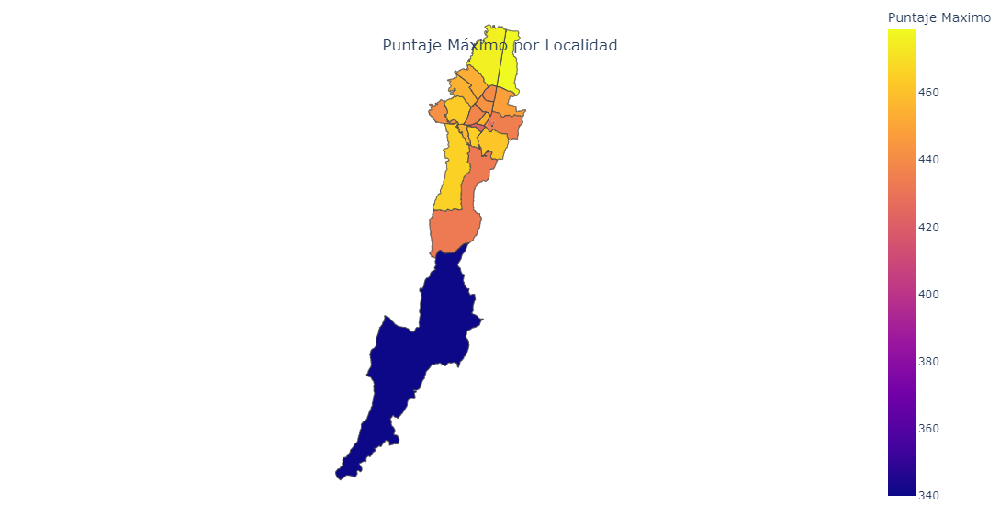

In [188]:
fig = px.choropleth(plot_bogota_gdf,
                   geojson=plot_bogota_gdf.geometry,
                   locations=plot_bogota_gdf.index,
                   color="Puntaje Maximo",
                   projection="mercator")

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    title=dict(
        text="Puntaje Máximo por Localidad",
        xanchor='center',
        x=0.5,
        yref='paper',
        yanchor='bottom',
        y=0.9,
        pad={'b': 0}
    ),
    margin={'r': 0, 't': 0, 'l': 0, 'b': 0},
    height=550,
    width=450
)
fig.show()

A continuación generaremos un par de gráficos estadísticos que nos permitirán generar algunas conclusiones sobre los datos. Para esto, generaremos consultas desde la base de datos a dataframes de pandas y con estos datos realizaremos los graficos en Plotly.

In [112]:
import plotly.express as px
import plotly.graph_objs as go
import plotly.graph_objects as go

In [113]:
# Sumarizar valores
match = {"$match": {}}
project = {'$project': {
            '_id' : 0,
            'DEPTO': '$_id.DEPTO',
            'ESTU_MCPIO_RESIDE': '$_id.ESTU_MCPIO_RESIDE',
            'ESTU_GENERO': '$_id.ESTU_GENERO',
            'PERIODO': '$_id.PERIODO',
            'ESTU_DEDICACIONINTERNET': '$_id.ESTU_DEDICACIONINTERNET',
            'CANTIDAD': '$CANTIDAD',
            'PROMEDIO_LECTURACRITICA': '$PROMEDIO_LECTURACRITICA',
            'MINIMO_LECTURACRITICA': '$MINIMO_LECTURACRITICA',
            'MAXIMO_LECTURACRITICA': '$MAXIMO_LECTURACRITICA',
            'PROMEDIO_MATEMATICAS': '$PROMEDIO_MATEMATICAS',
            'MINIMO_MATEMATICAS': '$MINIMO_MATEMATICAS',
            'MAXIMO_MATEMATICAS': '$MAXIMO_MATEMATICAS',
            'PROMEDIO_CIENCIASNATURALES': '$PROMEDIO_CIENCIASNATURALES',
            'MINIMO_CIENCIASNATURALES': '$MINIMO_CIENCIASNATURALESV',
            'MAXIMO_CIENCIASNATURALES': '$MAXIMO_CIENCIASNATURALES',
            'PROMEDIO_SOCIALESCIUDADANAS': '$PROMEDIO_SOCIALESCIUDADANAS',
            'MINIMO_SOCIALESCIUDADANAS': '$MINIMO_SOCIALESCIUDADANAS',
            'MAXIMO_SOCIALESCIUDADANAS': '$MAXIMO_SOCIALESCIUDADANAS',
            'PROMEDIO_INGLES': '$PROMEDIO_INGLES',
            'MINIMO_INGLES': '$MINIMO_INGLES',
            'MAXIMO_INGLES': '$MAXIMO_INGLES'
        }}

group = {'$group': {'_id':{'DEPTO':'$ESTU_DEPTO_RESIDE'
                           , 'ESTU_MCPIO_RESIDE': '$ESTU_MCPIO_RESIDE'
                           , 'ESTU_GENERO':'$ESTU_GENERO'
                           , 'PERIODO':'$PERIODO'
                           , 'ESTU_DEDICACIONINTERNET':'$ESTU_DEDICACIONINTERNET'}
                    , 'CANTIDAD': {'$sum': 1}
                    , 'PROMEDIO_LECTURACRITICA':{'$avg':'$PUNTAJE.PUNT_LECTURA_CRITICA'}
                    , 'MINIMO_LECTURACRITICA':{'$min':'$PUNTAJE.PUNT_LECTURA_CRITICA'}
                    , 'MAXIMO_LECTURACRITICA':{'$max':'$PUNTAJE.PUNT_LECTURA_CRITICA'}
                    , 'PROMEDIO_MATEMATICAS':{'$avg':'$PUNTAJE.PUNT_MATEMATICAS'}
                    , 'MINIMO_MATEMATICAS':{'$min':'$PUNTAJE.PUNT_MATEMATICAS'}
                    , 'MAXIMO_MATEMATICAS':{'$max':'$PUNTAJE.PUNT_MATEMATICAS'}
                    , 'PROMEDIO_CIENCIASNATURALES':{'$avg':'$PUNTAJE.PUNT_C_NATURALES'}
                    , 'MINIMO_CIENCIASNATURALES':{'$min':'$PUNTAJE.PUNT_C_NATURALES'}
                    , 'MAXIMO_CIENCIASNATURALES':{'$max':'$PUNTAJE.PUNT_C_NATURALES'}
                    , 'PROMEDIO_SOCIALESCIUDADANAS':{'$avg':'$PUNTAJE.PUNT_SOCIALES_CIUDADANAS'}
                    , 'MINIMO_SOCIALESCIUDADANAS':{'$min':'$PUNTAJE.PUNT_SOCIALES_CIUDADANAS'}
                    , 'MAXIMO_SOCIALESCIUDADANAS':{'$max':'$PUNTAJE.PUNT_SOCIALES_CIUDADANAS'}
                    , 'PROMEDIO_INGLES':{'$avg':'$PUNTAJE.PUNT_INGLES'}
                    , 'MINIMO_INGLES':{'$min':'$PUNTAJE.PUNT_INGLES'}
                    , 'MAXIMO_INGLES':{'$max':'$PUNTAJE.PUNT_INGLES'}
                   }}
sort = {'$sort': {}}
df_query_plot = query_agg_dataframe(collection = db["icfes_estudiante_estudiante"], match = match, project = project, group = group, sort = sort)

Generamos gráfico de cajas para los puntajes en las pruebas individuales:

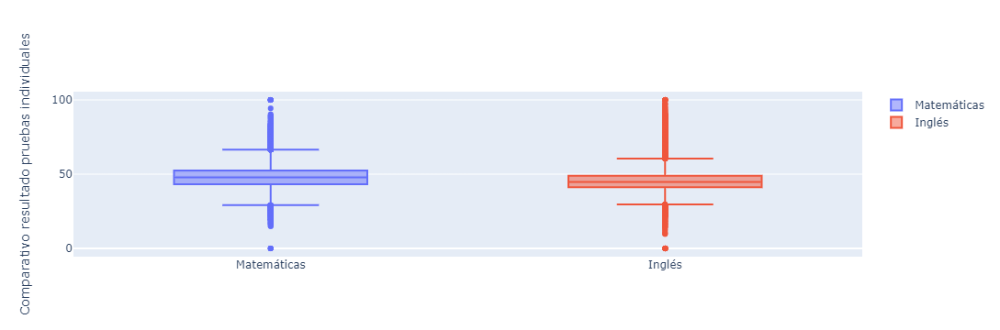

In [189]:
# Grafico de cajas
fig = go.Figure(data=[
#    go.Box(y=df_query_plot["PROMEDIO_LECTURACRITICA"], name="Lectura crítica"),
    go.Box(y=df_query_plot["PROMEDIO_MATEMATICAS"], name="Matemáticas"),
#    go.Box(y=df_query_plot["PROMEDIO_CIENCIASNATURALES"], name="Ciencias naturales"),
#    go.Box(y=df_query_plot["PROMEDIO_SOCIALESCIUDADANAS"], name="Ciencias Sociales"),
    go.Box(y=df_query_plot["PROMEDIO_INGLES"], name="Inglés")

])
fig.update_yaxes(title_text="Comparativo resultado pruebas individuales")
fig.show()

En el gráfico de cajas se observa que la mediana de matemáticas es mayor que el de inglés, pero las distribuciones de ambos puntajes son muy similares, podría interpretarse de la siguiente manera:

La presencia de una mayor mediana en matemáticas sugiere que un mayor número de estudiantes puede haber obtenido puntajes más altos en matemáticas en comparación con inglés. Esto podría indicar que los estudiantes en general tienen un mejor desempeño en matemáticas que en inglés.

A pesar de que el puntaje de matemáticas es mayor, la similitud en la forma de las distribuciones de ambos puntajes sugiere que hay una gran superposición entre los puntajes de ambas materias. Es decir, aunque más estudiantes obtuvieron puntajes altos en matemáticas, muchos estudiantes aún pueden haber obtenido puntajes altos en inglés, y viceversa.

Esto podría indicar que hay factores específicos que pueden estar contribuyendo a un mejor desempeño en matemáticas en comparación con inglés. Esto podría ser atribuible a varios factores, como la calidad de la enseñanza, el interés de los estudiantes en la materia, la disponibilidad de recursos de aprendizaje, entre otros.

La presencia de un mayor número de valores atípicos en inglés indica que hubo algunos estudiantes que obtuvieron puntajes excepcionalmente altos en inglés en comparación con el resto de sus compañeros. Esto podría indicar que mientras que la mayoría de los estudiantes tuvieron un desempeño similar en inglés, un pequeño grupo de estudiantes destacó significativamente en ésta materia.

El hecho de que haya menos valores atípicos en matemáticas sugiere que, en general, los puntajes en matemáticas están más concentrados alrededor del puntaje promedio, con menos variabilidad en comparación con inglés.

En resumen, aunque el puntaje promedio en matemáticas sea mayor, la presencia de un mayor número de valores atípicos en inglés sugiere que hubo algunos estudiantes que tuvieron un desempeño excepcional en esta materia, superando incluso a aquellos con puntajes altos en matemáticas. Esto resalta la importancia de considerar tanto el puntaje la dispersión de los datos al evaluar el desempeño de los estudiantes en diferentes materias.

# Extracción de datos para Machine Learning

Para efectos del análisis de Machine Learning, realizaremos una prediccion del puntaje a obtener por el estudiante, teniendo en cuenta las siguientes variables:

* ESTU_GENERO
* ESTU_DEDICACIONLECTURADIARIA
* ESTU_DEDICACIONINTERNET
* FAMI_TIENEINTERNET
* FAMI_TIENECOMPUTADOR
* FAMI_ESTRATOVIVIENDA
* FAMI_EDUCACIONPADRE
* FAMI_EDUCACIONMADRE
* FAMI_NUMLIBROS
* FAMI_COMELECHEDERIVADOS
* FAMI_COMECARNEPESCADOHUEVO
* FAMI_SITUACIONECONOMICA
* COLE_NATURALEZA
* COLE_CALENDARIO
* COLE_CARACTER
* COLE_JORNADA

Exportaremos los datos desde las colecciones correspondientes a dataframes de Pandas y luego los consolidaremos en un Dataframe de Dask

In [117]:
# leer relativos al estudiante
match = {"$match": {}}
projection = {'ESTU_CONSECUTIVO': '$ESTU_CONSECUTIVO'
          ,'ESTU_GENERO': '$ESTU_GENERO'
          ,'ESTU_DEDICACIONLECTURADIARIA': '$ESTU_DEDICACIONLECTURADIARIA'
          ,'ESTU_DEDICACIONINTERNET': '$ESTU_DEDICACIONINTERNET'
          ,'PUNTAJE':'$PUNTAJE.PUNT_GLOBAL'}

schema = {'ESTU_CONSECUTIVO': str
          ,'ESTU_GENERO': str
          ,'ESTU_DEDICACIONLECTURADIARIA': str
          ,'ESTU_DEDICACIONINTERNET': str
          ,'PUNTAJE': int
        }

df_estudiante_ml = query_into_dataframe(db["icfes_estudiante_estudiante"], match, projection, schema)

In [119]:
# leer relativos al grupo familiar
match = {"$match": {}}
projection = {'ESTU_CONSECUTIVO': '$ESTU_CONSECUTIVO'
          ,'FAMI_TIENEINTERNET': '$FAMI_TIENEINTERNET'
          ,'FAMI_TIENECOMPUTADOR': '$FAMI_TIENECOMPUTADOR'
          ,'FAMI_ESTRATOVIVIENDA': '$FAMI_ESTRATOVIVIENDA'
          ,'FAMI_EDUCACIONPADRE': '$FAMI_EDUCACIONPADRE'
          ,'FAMI_EDUCACIONMADRE': '$FAMI_EDUCACIONMADRE'
          ,'FAMI_NUMLIBROS': '$FAMI_NUMLIBROS'
          ,'FAMI_COMELECHEDERIVADOS': '$FAMI_COMELECHEDERIVADOS'
          ,'FAMI_COMECARNEPESCADOHUEVO': '$FAMI_COMECARNEPESCADOHUEVO'
          ,'FAMI_SITUACIONECONOMICA': '$FAMI_SITUACIONECONOMICA'}

schema = {'ESTU_CONSECUTIVO': str
          ,'FAMI_TIENEINTERNET': str
          ,'FAMI_TIENECOMPUTADOR': str
          ,'FAMI_ESTRATOVIVIENDA': str
          ,'FAMI_EDUCACIONPADRE': str
          ,'FAMI_EDUCACIONMADRE': str
          ,'FAMI_NUMLIBROS': str
          ,'FAMI_COMELECHEDERIVADOS': str
          ,'FAMI_COMECARNEPESCADOHUEVO': str
          ,'FAMI_SITUACIONECONOMICA': str
        }

df_familia_ml = query_into_dataframe(db["icfes_estudiante_familia"], match, projection, schema)

In [121]:
# leer relativos a la institucion educativa
match = {"$match": {}}
projection = {'ESTU_CONSECUTIVO': '$ESTU_CONSECUTIVO'
          ,'COLE_NATURALEZA': '$COLE_NATURALEZA'
          ,'COLE_CALENDARIO': '$COLE_CALENDARIO'
          ,'COLE_CARACTER': '$COLE_CARACTER'
          ,'COLE_JORNADA': '$COLE_JORNADA'}

schema = {'ESTU_CONSECUTIVO': str
          ,'COLE_NATURALEZA': str
          ,'COLE_CALENDARIO': str
          ,'COLE_CARACTER': str
          ,'COLE_JORNADA': str
        }

df_colegio_ml = query_into_dataframe(db["icfes_estudiante_colegio"], match, projection, schema)

Realizamos el merge de los dataframes por la columna ESTU_CONSECUTIVO

In [123]:
df_merge_ml1 = df_estudiante_ml.merge(df_familia_ml.drop_duplicates(), on=['ESTU_CONSECUTIVO'], how='inner', indicator=True)
list_to_drop = ['_merge']
df_merge_ml1 = df_merge_ml1.drop(columns=list_to_drop)

In [125]:
df_merge_ml = df_merge_ml1.merge(df_colegio_ml.drop_duplicates(), on=['ESTU_CONSECUTIVO'], how='inner', indicator=True)
list_to_drop = ['_merge']
df_merge_ml = df_merge_ml.drop(columns=list_to_drop)

In [126]:
df_merge_ml.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3314351 entries, 0 to 3314350
Data columns (total 18 columns):
 #   Column                        Dtype 
---  ------                        ----- 
 0   ESTU_CONSECUTIVO              object
 1   ESTU_GENERO                   object
 2   ESTU_DEDICACIONLECTURADIARIA  object
 3   ESTU_DEDICACIONINTERNET       object
 4   PUNTAJE                       int64 
 5   FAMI_TIENEINTERNET            object
 6   FAMI_TIENECOMPUTADOR          object
 7   FAMI_ESTRATOVIVIENDA          object
 8   FAMI_EDUCACIONPADRE           object
 9   FAMI_EDUCACIONMADRE           object
 10  FAMI_NUMLIBROS                object
 11  FAMI_COMELECHEDERIVADOS       object
 12  FAMI_COMECARNEPESCADOHUEVO    object
 13  FAMI_SITUACIONECONOMICA       object
 14  COLE_NATURALEZA               object
 15  COLE_CALENDARIO               object
 16  COLE_CARACTER                 object
 17  COLE_JORNADA                  object
dtypes: int64(1), object(17)
memory usage: 455.

Con los dataframes Pandas combinados, realizamos la generación de un dataframe Dask

In [128]:
import dask.array as da
import dask.dataframe as dd

In [148]:
dd_merge_ml = dd.from_pandas(df_merge_ml, chunksize=500000)
dd_merge_ml

,ESTU_CONSECUTIVO,ESTU_GENERO,ESTU_DEDICACIONLECTURADIARIA,ESTU_DEDICACIONINTERNET,PUNTAJE,FAMI_TIENEINTERNET,FAMI_TIENECOMPUTADOR,FAMI_ESTRATOVIVIENDA,FAMI_EDUCACIONPADRE,FAMI_EDUCACIONMADRE,FAMI_NUMLIBROS,FAMI_COMELECHEDERIVADOS,FAMI_COMECARNEPESCADOHUEVO,FAMI_SITUACIONECONOMICA,COLE_NATURALEZA,COLE_CALENDARIO,COLE_CARACTER,COLE_JORNADA
npartitions=7,,,,,,,,,,,,,,,,,,
0,string,string,string,string,int64,string,string,string,string,string,string,string,string,string,string,string,string,string
500000,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3000000,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3314350,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [149]:
dd_merge_ml.info()

<class 'dask_expr.DataFrame'>
Columns: 18 entries, ESTU_CONSECUTIVO to COLE_JORNADA
dtypes: int64(1), string(17)

Sobre el dataframe Dask vamos a realizar la generación de variables categoricas, nominales y ordinales, con el fin de reemplazar los valores de texto que tienen. Esto con el fin de preparar los datos para el análisis mediante técnicas de Machine Learning.

Inicialmente realizaremos la revisión y transformación de las variables categóricas relacionadas con el estudiante.

Construimos la lista de las variables categóricas a analizar para datos relacionados con el estudiante:

* ESTU_GENERO: Género del estudiante
* ESTU_DEDICACIONLECTURADIARIA: Usualmente, ¿cuánto tiempo al día dedica a leer por entretenimiento?
* ESTU_DEDICACIONINTERNET: Usualmente, ¿cuánto tiempo al día dedica a navegar en internet? Excluya actividades académicas

Para la transformación utilizaremos la siguiente función que retorna los valores por variable:

In [150]:
def analyze_cat(df, cat, verbose = True):
    """"
    Función analyze_cat: Genera un resumen de los valores para variables categoricas que se identifican en el dataframe
                         Se imprime la agrupación y conteo de datos para los valores literales de las categorias para las columnas indicadas
    
    Parámetros:
        df       (dataframe): Dataframe sobre el cual se realizara el análisis
        cat (list of string): Lista de columnas sobre las cuales se realizara el análisis de las categorias
        verbose    (boolean): Si True muestra agrupamiento de los valores categoricos de la columna
                              Si False retorna arreglo con los valores unicos que corresponden a las categorias de la columna
    
    Return:
        Arreglo numpy con los valores que conforman la categoria si verbose = False
    
    Ejemplo:
    
        >>> analyze_cat(df = df_icfes, cat = categorical_cols)
            
            El tamaño del dataframe es 42 columnas y 3316179 filas.
            Cantidad de columnas con valores 0 o nulos: 32 
            ...
    """
    for col in cat:
        if verbose:
            print("\n Categorias de la columna ", col)
            display(df.groupby([col])[col].count().compute())
        else:
            #display(df[col].unique())
            return df[col].unique().compute()

In [151]:
categorical_cols = ['ESTU_GENERO','ESTU_DEDICACIONLECTURADIARIA','ESTU_DEDICACIONINTERNET']

In [152]:
dd_analyze = analyze_cat(df = dd_merge_ml, cat = categorical_cols)


 Categorias de la columna  ESTU_GENERO


ESTU_GENERO
F    1799669
M    1514470
Name: ESTU_GENERO, dtype: int64


 Categorias de la columna  ESTU_DEDICACIONLECTURADIARIA


ESTU_DEDICACIONLECTURADIARIA
30 minutos o menos            1205606
Entre 1 y 2 horas              337261
Entre 30 y 60 minutos          852174
Más de 2 horas                 135336
No leo por entretenimiento     611705
Name: ESTU_DEDICACIONLECTURADIARIA, dtype: int64


 Categorias de la columna  ESTU_DEDICACIONINTERNET


ESTU_DEDICACIONINTERNET
30 minutos o menos       504976
Entre 1 y 3 horas        960928
Entre 30 y 60 minutos    772025
Más de 3 horas           716559
No Navega Internet       179983
Name: ESTU_DEDICACIONINTERNET, dtype: int64

Realizamos la creación de las nuevas columnas con las categorías definidas mediante la siguiente función.

In [153]:
def cat_nominal(df, col):
    """"
    Función cat_nominal: Crea columnas con variables dummy para la columna que se indica, la cual debe corresponder a una columna categorica
                         nominal
    
    Parámetros:
        df  (dataframe): Dataframe con los datos
        col    (string): Columna del dataframe a convertir en variables dummy
    
    Return:
        df  (dataframe): Dataframe con columnas nuevas correspondientes a las variables dummy generadas para la categoria
    
    Ejemplo:
    
        >>> df = cat_nominal(df = df_icfes, col = 'ESTU_GENERO')
        
            Dummy variable columns generated: ['CAT_ESTU_GENERO_M', 'CAT_ESTU_GENERO_F']
        
    """
    rename_col = {}
    categorias = analyze_cat(df = df, cat = [col], verbose = False)
    new_categorias = [x for x in categorias if str(x) != '<NA>']
    for i in new_categorias:
        rename_col[i] = ('CAT_' + col + '_ES_' + i.upper())
    df[col] = df[col].astype('category')
    df[col] = df[col].cat.as_known()
    df_dummy = dd.get_dummies(df[col], dtype=float, drop_first = False)
    df = dd.concat([df,df_dummy], axis=1)
    df_return = df.rename(columns=rename_col)
    print('Dummy variable columns generated:', list(rename_col.values()))
    return df_return

Para las variables asociadas al estudiante:

In [154]:
dd_merge_ml = cat_nominal(df = dd_merge_ml, col = 'ESTU_GENERO')

Dummy variable columns generated: ['CAT_ESTU_GENERO_ES_M', 'CAT_ESTU_GENERO_ES_F']


In [155]:
#Variables categoricas ordinales
#
cat_lecturadiaria = {"No leo por entretenimiento" : 0,"30 minutos o menos" : 1,"Entre 30 y 60 minutos" : 2,"Entre 1 y 2 horas" : 3,"Más de 2 horas" : 4}
dd_merge_ml['CAT_ESTU_DEDICACIONLECTURADIARIA'] = dd_merge_ml['ESTU_DEDICACIONLECTURADIARIA'].map(cat_lecturadiaria)
#
cat_dedinternet = {"No Navega Internet" : 0,"30 minutos o menos" : 1,"Entre 30 y 60 minutos" : 2,"Entre 1 y 3 horas" : 3,"Más de 3 horas" : 4}
dd_merge_ml['CAT_ESTU_DEDICACIONINTERNET'] = dd_merge_ml['ESTU_DEDICACIONINTERNET'].map(cat_dedinternet)
#

Construimos la lista de las variables categoricas a analizar para datos relacionados con el entorno familiar del estudiante:

* FAMI_ESTRATOVIVIENDA: Estrato socioeconómico de la vivienda según recibo de energía eléctrica
* FAMI_EDUCACIONPADRE: Nivel educativo más alto alcanzado por el padre
* FAMI_EDUCACIONMADRE: Nivel educativo más alto alcanzado por la madre
* FAMI_TIENEINTERNET: ¿Su hogar cuenta con servicio o conexión a internet?
* FAMI_TIENECOMPUTADOR: ¿Cuáles de los siguientes bienes posee su hogar?: Computador
* FAMI_NUMLIBROS: ¿Cuántos libros físicos o electrónicos hay en su hogar excluyendo periódicos, revistas, directorios telefónicos y libros del colegio?
* FAMI_COMELECHEDERIVADOS: ¿Cuántas veces por semana se comen los siguientes alimentos en su hogar? Leche y sus derivados
* FAMI_COMECARNEPESCADOHUEVO: ¿Cuántas veces por semana se comen los siguientes alimentos en su hogar? Carne (pollo, pavo, res, cordero, cerdo, conejo, etc.), pescados o huevos
* FAMI_SITUACIONECONOMICA: Con respecto al año inmediatamente anterior, la situación económica de su hogar es: Peor, Igual, Mejor

In [157]:
categorical_cols = ['FAMI_ESTRATOVIVIENDA','FAMI_EDUCACIONPADRE','FAMI_EDUCACIONMADRE'
                    ,'FAMI_TIENEINTERNET','FAMI_TIENECOMPUTADOR'
                    ,'FAMI_NUMLIBROS','FAMI_COMELECHEDERIVADOS'
                    ,'FAMI_COMECARNEPESCADOHUEVO','FAMI_SITUACIONECONOMICA']

In [158]:
analyze_cat(df = dd_merge_ml, cat = categorical_cols)


 Categorias de la columna  FAMI_ESTRATOVIVIENDA


FAMI_ESTRATOVIVIENDA
Estrato 1       956382
Estrato 2      1126165
Estrato 3       665094
Estrato 4       173180
Estrato 5        65475
Estrato 6        39256
Sin Estrato     100495
Name: FAMI_ESTRATOVIVIENDA, dtype: int64


 Categorias de la columna  FAMI_EDUCACIONPADRE


FAMI_EDUCACIONPADRE
Educación profesional completa          315251
Educación profesional incompleta         66468
Ninguno                                 115863
No Aplica                                39071
No sabe                                 200990
Postgrado                                75805
Primaria completa                       308280
Primaria incompleta                     578735
Secundaria (Bachillerato) completa      731286
Secundaria (Bachillerato) incompleta    437923
Técnica o tecnológica completa          212102
Técnica o tecnológica incompleta         67863
Name: FAMI_EDUCACIONPADRE, dtype: int64


 Categorias de la columna  FAMI_EDUCACIONMADRE


FAMI_EDUCACIONMADRE
Educación profesional completa          376480
Educación profesional incompleta         83897
Ninguno                                  72063
No Aplica                                 6535
No sabe                                  63172
Postgrado                                84318
Primaria completa                       306594
Primaria incompleta                     451644
Secundaria (Bachillerato) completa      836764
Secundaria (Bachillerato) incompleta    449641
Técnica o tecnológica completa          317946
Técnica o tecnológica incompleta        100344
Name: FAMI_EDUCACIONMADRE, dtype: int64


 Categorias de la columna  FAMI_TIENEINTERNET


FAMI_TIENEINTERNET
No    1062277
Si    2083823
Name: FAMI_TIENEINTERNET, dtype: int64


 Categorias de la columna  FAMI_TIENECOMPUTADOR


FAMI_TIENECOMPUTADOR
No    1331702
Si    1874203
Name: FAMI_TIENECOMPUTADOR, dtype: int64


 Categorias de la columna  FAMI_NUMLIBROS


FAMI_NUMLIBROS
0 A 10 LIBROS        1299179
11 A 25 LIBROS        942705
26 A 100 LIBROS       634078
MÁS DE 100 LIBROS     210175
Name: FAMI_NUMLIBROS, dtype: int64


 Categorias de la columna  FAMI_COMELECHEDERIVADOS


FAMI_COMELECHEDERIVADOS
1 o 2 veces por semana          1064712
3 a 5 veces por semana           818123
Nunca o rara vez comemos eso     285987
Todos o casi todos los días      954929
Name: FAMI_COMELECHEDERIVADOS, dtype: int64


 Categorias de la columna  FAMI_COMECARNEPESCADOHUEVO


FAMI_COMECARNEPESCADOHUEVO
1 o 2 veces por semana           780446
3 a 5 veces por semana           948495
Nunca o rara vez comemos eso     155919
Todos o casi todos los días     1253246
Name: FAMI_COMECARNEPESCADOHUEVO, dtype: int64


 Categorias de la columna  FAMI_SITUACIONECONOMICA


FAMI_SITUACIONECONOMICA
Igual    1953478
Mejor     731500
Peor      522256
Name: FAMI_SITUACIONECONOMICA, dtype: int64

De acuerdo al resultado podemos concluir que en las siguientes son variables categóricas nominales:

* FAMI_TIENEINTERNET
* FAMI_TIENECOMPUTADOR

Y las siguientes son variables categóricas ordinales:

* FAMI_ESTRATOVIVIENDA
* FAMI_EDUCACIONPADRE
* FAMI_EDUCACIONMADRE
* FAMI_NUMLIBROS
* FAMI_COMELECHEDERIVADOS
* FAMI_COMECARNEPESCADOHUEVO
* FAMI_SITUACIONECONOMICA

Para la generación de categorias, crearemos variables adicionale CAT_*. Las categorias definidas son:

* FAMI_ESTRATOVIVIENDA (Ordinal)

Sin Estrato : 0

Estrato 1 : 1

Estrato 2 : 2

Estrato 3 : 3

Estrato 4 : 4

Estrato 5 : 5

Estrato 6 : 6
 
* FAMI_EDUCACIONPADRE (Ordinal)

Ninguno : 0

No Aplica : 1

No sabe : 2

Primaria incompleta : 3

Primaria completa : 4

Secundaria (Bachillerato) incompleta : 5

Secundaria (Bachillerato) completa : 6

Técnica o tecnológica incompleta : 7

Técnica o tecnológica completa : 8

Educación profesional incompleta : 9

Educación profesional completa : 10

Postgrado : 11

* FAMI_EDUCACIONMADRE (Ordinal)

Ninguno : 0

No Aplica : 1

No sabe : 2

Primaria incompleta : 3

Primaria completa : 4

Secundaria (Bachillerato) incompleta : 5

Secundaria (Bachillerato) completa : 6

Técnica o tecnológica incompleta : 7

Técnica o tecnológica completa : 8

Educación profesional incompleta : 9

Educación profesional completa : 10

Postgrado : 11

* FAMI_NUMLIBROS (Ordinal)
 
0 A 10 LIBROS : 0

11 A 25 LIBROS : 1

26 A 100 LIBROS : 2

MÁS DE 100 LIBROS : 3

* FAMI_COMELECHEDERIVADOS (Ordinal)

Nunca o rara vez comemos eso : 0

1 o 2 veces por semana : 1

3 a 5 veces por semana : 2

Todos o casi todos los días : 3

* FAMI_COMECARNEPESCADOHUEVO (Ordinal)

Nunca o rara vez comemos eso : 0

1 o 2 veces por semana : 1

3 a 5 veces por semana : 2

Todos o casi todos los días : 3

* FAMI_SITUACIONECONOMICA (Ordinal)

Peor : 0

Igual : 1

Mejor : 2

* FAMI_TIENEINTERNET (Nominal): Se definirán variables dummy para identificar si el grupo familiar del estudiante tiene o no la caracteristica
 
FAMI_TIENEINTERNET_ES_NO

FAMI_TIENEINTERNET_ES_SI

* FAMI_TIENECOMPUTADOR (Nominal): Se definirán variables dummy para identificar si el grupo familiar del estudiante tiene o no la caracteristica
 
FAMI_TIENECOMPUTADOR_ES_NO

FAMI_TIENECOMPUTADOR_ES_SI

No : 0

Si : 1

Realizamos la creación de las nuevas columnas con las categorias definidas.

In [159]:
# variables categoricas nominales
dd_merge_ml = cat_nominal(df = dd_merge_ml, col = 'FAMI_TIENEINTERNET')
dd_merge_ml = cat_nominal(df = dd_merge_ml, col = 'FAMI_TIENECOMPUTADOR')

Dummy variable columns generated: ['CAT_FAMI_TIENEINTERNET_ES_SI', 'CAT_FAMI_TIENEINTERNET_ES_NO']
Dummy variable columns generated: ['CAT_FAMI_TIENECOMPUTADOR_ES_SI', 'CAT_FAMI_TIENECOMPUTADOR_ES_NO']


In [160]:
# variables categoricas ordinales
cat_estrato = {'Sin Estrato':0, 'Estrato 1':1, 'Estrato 2':2,'Estrato 3':3,'Estrato 4':4,'Estrato 5':5,'Estrato 6':6}
dd_merge_ml['CAT_FAMI_ESTRATOVIVIENDA'] = dd_merge_ml['FAMI_ESTRATOVIVIENDA'].map(cat_estrato)
#
cat_educacion = {'Ninguno' : 0,'No Aplica' : 1,'No sabe' : 2,'Primaria incompleta' : 3,'Primaria completa' : 4,'Secundaria (Bachillerato) incompleta' : 5
                 ,'Secundaria (Bachillerato) completa' : 6,'Técnica o tecnológica incompleta' : 7,'Técnica o tecnológica completa' : 8
                 ,'Educación profesional incompleta' : 9,'Educación profesional completa' : 10,'Postgrado' : 11}
dd_merge_ml['CAT_FAMI_EDUCACIONPADRE'] = dd_merge_ml['FAMI_EDUCACIONPADRE'].map(cat_educacion)
#
dd_merge_ml['CAT_FAMI_EDUCACIONMADRE'] = dd_merge_ml['FAMI_EDUCACIONMADRE'].map(cat_educacion)
#
cat_numlibros = {"0 A 10 LIBROS" : 0,"11 A 25 LIBROS" : 1,"26 A 100 LIBROS" : 2,"MÁS DE 100 LIBROS" : 3}
dd_merge_ml['CAT_FAMI_NUMLIBROS'] = dd_merge_ml['FAMI_NUMLIBROS'].map(cat_numlibros)
#
cat_comida = {"Nunca o rara vez comemos eso" : 0,"1 o 2 veces por semana" : 1,"3 a 5 veces por semana" : 2,"Todos o casi todos los días" : 3}
dd_merge_ml['CAT_FAMI_COMELECHEDERIVADOS'] = dd_merge_ml['FAMI_COMELECHEDERIVADOS'].map(cat_comida)
#
dd_merge_ml['CAT_FAMI_COMECARNEPESCADOHUEVO'] = dd_merge_ml['FAMI_COMECARNEPESCADOHUEVO'].map(cat_comida)
#
cat_situeco = {"Peor" : 0,"Igual" : 1,"Mejor" : 2}
dd_merge_ml['CAT_FAMI_SITUACIONECONOMICA'] = dd_merge_ml['FAMI_SITUACIONECONOMICA'].map(cat_situeco)

Construimos la lista de las variables categóricas a analizar para datos relacionados con el entorno escolar del estudiante:

* COLE_NATURALEZA: Indica la naturaleza del Establecimiento
* COLE_CALENDARIO: Calendario académico del Establecimiento
* COLE_CARACTER: Indica el carácter del Establecimiento
* COLE_JORNADA: Jornada de la Sede

In [162]:
categorical_cols = ['COLE_NATURALEZA','COLE_CALENDARIO','COLE_CARACTER','COLE_JORNADA']

In [163]:
analyze_cat(df = dd_merge_ml, cat = categorical_cols)


 Categorias de la columna  COLE_NATURALEZA


COLE_NATURALEZA
NO OFICIAL     849995
OFICIAL       2464356
Name: COLE_NATURALEZA, dtype: int64


 Categorias de la columna  COLE_CALENDARIO


COLE_CALENDARIO
A       3203380
B         93901
OTRO      17070
Name: COLE_CALENDARIO, dtype: int64


 Categorias de la columna  COLE_CARACTER


COLE_CARACTER
ACADÉMICO            1742846
NO APLICA              41775
TÉCNICO               362092
TÉCNICO/ACADÉMICO    1075901
Name: COLE_CARACTER, dtype: int64


 Categorias de la columna  COLE_JORNADA


COLE_JORNADA
COMPLETA     576543
MAÑANA      1456196
NOCHE        168346
SABATINA     197933
TARDE        347456
UNICA        567877
Name: COLE_JORNADA, dtype: int64

De acuerdo al resultado podemos concluir que en las siguientes son variables categóricas nominales:

* COLE_NATURALEZA
* COLE_CALENDARIO
* COLE_CARACTER
* COLE_JORNADA

Para la generación de categorías, crearemos variables adicionale CAT_*. Las categorias definidas son:

* COLE_NATURALEZA (Nominal): Se definirán variables dummy para identificar si el grupo familiar del estudiante tiene o no la caracteristica
 
COLE_NATURALEZA_ES_OFICIAL

COLE_NATURALEZA_ES_NO OFICIAL

* COLE_CALENDARIO (Nominal): Se definirán variables dummy para identificar si el grupo familiar del estudiante tiene o no la caracteristica
 
COLE_CALENDARIO_ES_A

COLE_CALENDARIO_ES_B

COLE_CALENDARIO_ES_OTRO

* COLE_CARACTER (Nominal): Se definirán variables dummy para identificar si el grupo familiar del estudiante tiene o no la caracteristica
 
COLE_CARACTER_ES_NO APLICA 

COLE_CARACTER_ES_ACADÉMICO

COLE_CARACTER_ES_TÉCNICO

COLE_CARACTER_ES_TÉCNICO/ACADÉMICO

* COLE_JORNADA (Nominal): Se definirán variables dummy para identificar si el grupo familiar del estudiante tiene o no la caracteristica
 
COLE_JORNADA_ES_MAÑANA

COLE_JORNADA_ES_TARDE

COLE_JORNADA_ES_NOCHE

COLE_JORNADA_ES_UNICA

COLE_JORNADA_ES_COMPLETA

COLE_JORNADA_ES_SABATINA

Realizamos la creación de las nuevas columnas con las categorias definidas.

In [164]:
# variables categoricas nominales
dd_merge_ml = cat_nominal(df = dd_merge_ml, col = 'COLE_NATURALEZA')
dd_merge_ml = cat_nominal(df = dd_merge_ml, col = 'COLE_CALENDARIO')
dd_merge_ml = cat_nominal(df = dd_merge_ml, col = 'COLE_CARACTER')
dd_merge_ml = cat_nominal(df = dd_merge_ml, col = 'COLE_JORNADA')

Dummy variable columns generated: ['CAT_COLE_NATURALEZA_ES_NO OFICIAL', 'CAT_COLE_NATURALEZA_ES_OFICIAL']
Dummy variable columns generated: ['CAT_COLE_CALENDARIO_ES_OTRO', 'CAT_COLE_CALENDARIO_ES_B', 'CAT_COLE_CALENDARIO_ES_A']
Dummy variable columns generated: ['CAT_COLE_CARACTER_ES_TÉCNICO', 'CAT_COLE_CARACTER_ES_TÉCNICO/ACADÉMICO', 'CAT_COLE_CARACTER_ES_NO APLICA', 'CAT_COLE_CARACTER_ES_ACADÉMICO']
Dummy variable columns generated: ['CAT_COLE_JORNADA_ES_NOCHE', 'CAT_COLE_JORNADA_ES_SABATINA', 'CAT_COLE_JORNADA_ES_MAÑANA', 'CAT_COLE_JORNADA_ES_TARDE', 'CAT_COLE_JORNADA_ES_COMPLETA', 'CAT_COLE_JORNADA_ES_UNICA']


Eliminaremos las columnas no requeridas, es decir las columnas con valores de texto para dejar solo las variables categóricas generadas.

In [167]:
columns_to_drop = ['ESTU_GENERO','ESTU_DEDICACIONLECTURADIARIA','ESTU_DEDICACIONINTERNET','FAMI_TIENEINTERNET','FAMI_TIENECOMPUTADOR'
                   ,'FAMI_ESTRATOVIVIENDA','FAMI_EDUCACIONPADRE','FAMI_EDUCACIONMADRE','FAMI_NUMLIBROS','FAMI_COMELECHEDERIVADOS'
                   ,'FAMI_COMECARNEPESCADOHUEVO','FAMI_SITUACIONECONOMICA','COLE_NATURALEZA','COLE_CALENDARIO','COLE_CARACTER','COLE_JORNADA']

dd_merge_ml = dd_merge_ml.drop(columns = columns_to_drop)

In [168]:
dd_merge_ml.info()

<class 'dask_expr.DataFrame'>
Columns: 32 entries, ESTU_CONSECUTIVO to CAT_COLE_JORNADA_ES_UNICA
dtypes: float64(30), int64(1), string(1)

### Analizar las columnas para determinar si hay valores nulos

Realizamos identificación de valores nulos sobre las columnas de categoría definidas. Como el número de registros es relativamente pequeño respecto al tamaño del dataframe, procedemos a borrar las filas:

In [170]:
dd_merge_ml.isnull().sum().compute()

ESTU_CONSECUTIVO                               0
PUNTAJE                                        0
CAT_ESTU_GENERO_ES_F                           0
CAT_ESTU_GENERO_ES_M                           0
CAT_ESTU_DEDICACIONLECTURADIARIA          172269
CAT_ESTU_DEDICACIONINTERNET               179880
CAT_FAMI_TIENEINTERNET_ES_SI                   0
CAT_FAMI_TIENEINTERNET_ES_NO                   0
CAT_FAMI_TIENECOMPUTADOR_ES_SI                 0
CAT_FAMI_TIENECOMPUTADOR_ES_NO                 0
CAT_FAMI_ESTRATOVIVIENDA                  188304
CAT_FAMI_EDUCACIONPADRE                   164714
CAT_FAMI_EDUCACIONMADRE                   164953
CAT_FAMI_NUMLIBROS                        228214
CAT_FAMI_COMELECHEDERIVADOS               190600
CAT_FAMI_COMECARNEPESCADOHUEVO            176245
CAT_FAMI_SITUACIONECONOMICA               107117
CAT_COLE_NATURALEZA_ES_NO OFICIAL              0
CAT_COLE_NATURALEZA_ES_OFICIAL                 0
CAT_COLE_CALENDARIO_ES_OTRO                    0
CAT_COLE_CALENDARIO_

In [171]:
dd_merge_ml = dd_merge_ml.dropna(subset = ['CAT_FAMI_ESTRATOVIVIENDA'])
dd_merge_ml = dd_merge_ml.dropna(subset = ['CAT_FAMI_EDUCACIONPADRE'])
dd_merge_ml = dd_merge_ml.dropna(subset = ['CAT_FAMI_EDUCACIONMADRE'])
dd_merge_ml = dd_merge_ml.dropna(subset = ['CAT_FAMI_NUMLIBROS'])
dd_merge_ml = dd_merge_ml.dropna(subset = ['CAT_FAMI_SITUACIONECONOMICA'])
dd_merge_ml = dd_merge_ml.dropna(subset = ['CAT_FAMI_COMELECHEDERIVADOS'])
dd_merge_ml = dd_merge_ml.dropna(subset = ['CAT_ESTU_DEDICACIONINTERNET'])
dd_merge_ml = dd_merge_ml.dropna(subset = ['CAT_ESTU_DEDICACIONLECTURADIARIA'])
dd_merge_ml = dd_merge_ml.dropna(subset = ['CAT_FAMI_COMECARNEPESCADOHUEVO'])

Después de eliminados los registros:

In [172]:
dd_merge_ml.isnull().sum().compute()

ESTU_CONSECUTIVO                          0
PUNTAJE                                   0
CAT_ESTU_GENERO_ES_F                      0
CAT_ESTU_GENERO_ES_M                      0
CAT_ESTU_DEDICACIONLECTURADIARIA          0
CAT_ESTU_DEDICACIONINTERNET               0
CAT_FAMI_TIENEINTERNET_ES_SI              0
CAT_FAMI_TIENEINTERNET_ES_NO              0
CAT_FAMI_TIENECOMPUTADOR_ES_SI            0
CAT_FAMI_TIENECOMPUTADOR_ES_NO            0
CAT_FAMI_ESTRATOVIVIENDA                  0
CAT_FAMI_EDUCACIONPADRE                   0
CAT_FAMI_EDUCACIONMADRE                   0
CAT_FAMI_NUMLIBROS                        0
CAT_FAMI_COMELECHEDERIVADOS               0
CAT_FAMI_COMECARNEPESCADOHUEVO            0
CAT_FAMI_SITUACIONECONOMICA               0
CAT_COLE_NATURALEZA_ES_NO OFICIAL         0
CAT_COLE_NATURALEZA_ES_OFICIAL            0
CAT_COLE_CALENDARIO_ES_OTRO               0
CAT_COLE_CALENDARIO_ES_B                  0
CAT_COLE_CALENDARIO_ES_A                  0
CAT_COLE_CARACTER_ES_TÉCNICO    

Vamos a generar una variable adicional que permita hacer la clasificación respecto a una de las categorías del puntaje global para determinar si se aprueba o no la prueba Saber11 por parte del estudiante.

La nueva variable APROBAR_EXAMEN tendrá el valor 1 para resultados en la prueba global correspondientes a puntaje global entre 300 y 500 puntos. Para efectos del análisis, podemos cambiar el valor respecto al cual se genera la nueva variable.

In [174]:
def gen_dataset(df, var, new_var, score):
    """"
    Función gen_dataset: Generar dataset con nueva columna para analisis basado en un valor.
    
    Parámetros:
        df  (dataframe): Dataframe con los datos
        var    (string): Variable a analizar
        new_var(string): Nombre de variable a generar
        score     (int): Valor de comparación para la generación de la nueva variable
    
    Return:
        df  (dataframe): Dataframe con la nueva columna.
    
    Ejemplo:
    
        >>> df_icfes_clas = gen_dataset(df_icfes, 'CAT_PUNT_GLOBAL', 'APROBAR_EXAMEN', 2)
        done
    """
    df[new_var] = df.apply(lambda x: 1 if (x[var] >= score) else 0, axis=1, meta = ('int'))
    df = df.astype({col: 'int16' for col in df.select_dtypes('int64').columns})
    print("done")
    return df

In [175]:
dd_icfes = gen_dataset(dd_merge_ml, 'PUNTAJE', 'APROBAR_EXAMEN', 300)

done


In [176]:
dd_icfes.groupby(['APROBAR_EXAMEN'])['APROBAR_EXAMEN'].count().compute()

APROBAR_EXAMEN
0    2374171
1     583180
Name: APROBAR_EXAMEN, dtype: int64

Generaremos un nuevo dataframe con las características balanceadas, teniendo en cuenta el desbalance que se observa en las mismas para la variable APROBAR_EXAMEN

In [177]:
import numpy as np

def gen_balanced_sample(df, var, score1, score2, frac = 1):
    """"
    Función gen_dataset: Generar dataset con nueva columna para analisis basado en un valor.

    Parámetros:
        df  (dataframe): Dataframe con los datos
        var    (string): Variable a analizar
        new_var(string): Nombre de variable a generar
        score     (int): Valor de comparación para la generación de la nueva variable

    Return:
        df  (dataframe): Dataframe con la nueva columna.

    Ejemplo:

        >>> df_icfes_clas = gen_dataset(df_icfes, 'CAT_PUNT_GLOBAL', 'APROBAR_EXAMEN', 2)
        done
    """
    # generar dataset balanceado entre las dos categorias de la variable target
    df1 = df.loc[df[var] == score1]
    df2 = df.loc[df[var] == score2]
    #
    # dataframe size
    size1 = len(df1[df1[var] == score1])
    size2 = len(df2[df2[var] == score2])
    #
    min_size = min(size1, size2)
    #
    # generate random sample
    if (min_size == size1):
        df_sample1 = df1
        df_sample2 = df2.sample(frac = (min_size / size2))
    else:
        df_sample1 = df1.sample(frac = (min_size / size1))
        df_sample2 = df2
    #
    normal_distributed_df = dd.concat([df_sample1, df_sample2])
    #
    # Shuffle dataframe rows
    df_sample = normal_distributed_df.sample(frac = frac, random_state=42)
    #
    print("done")
    return df_sample

In [178]:
dd_icfes_sample = gen_balanced_sample(df = dd_icfes, var = 'APROBAR_EXAMEN', score1 = 0, score2 = 1, frac = 1)

done


In [180]:
dd_icfes_sample.groupby(['APROBAR_EXAMEN'])['APROBAR_EXAMEN'].count().compute()

APROBAR_EXAMEN
0    583179
1    583180
Name: APROBAR_EXAMEN, dtype: int64

Con lo cual las etiquetas quedan balanceadas.

Realizamos al cálculo de correlación de la variable APROBAR_EXAMEN contra las demas variables del dataframe con el fin de seleccionar las más correlacionadas.

In [181]:
pd.options.display.max_rows = 999

In [182]:
def calc_corr(df, var):
    """"
    Función categorias: Crea columnas los valores de categorias para las variables cuantitativas

    Parámetros:
        df   (dataframe): Dataframe con los datos
        var     (string): Variable sobre la cual se realizara cálculo de la correlación respecto a las variables 
                          categoricas del dataframe.

    Return:
        corr    (Series): Serie de datos con el resultado de la correlación

    Ejemplo:

        >>> df_corr = calc_corr(df = df_icfes, var = 'CAT_PUNT_GLOBAL')

    """
    cols_list = df.columns.tolist()
    df_corr = df[df.columns.intersection(cols_list)]
    corr = df_corr.corr(numeric_only=True).compute()
    #corr = df_corr.corr(numeric_only=True)[var][::-1]
    return corr[var].sort_values()[::-1]

In [183]:
df_corr = calc_corr(df = dd_icfes_sample, var = 'APROBAR_EXAMEN')
df_corr

APROBAR_EXAMEN                            1.000000
PUNTAJE                                   0.835336
CAT_FAMI_EDUCACIONMADRE                   0.369600
CAT_FAMI_EDUCACIONPADRE                   0.326887
CAT_FAMI_NUMLIBROS                        0.324054
CAT_FAMI_TIENECOMPUTADOR_ES_SI            0.309884
CAT_FAMI_ESTRATOVIVIENDA                  0.297924
CAT_COLE_NATURALEZA_ES_NO OFICIAL         0.294974
CAT_COLE_JORNADA_ES_COMPLETA              0.283806
CAT_FAMI_TIENEINTERNET_ES_SI              0.283191
CAT_FAMI_COMELECHEDERIVADOS               0.262550
CAT_FAMI_COMECARNEPESCADOHUEVO            0.223779
CAT_ESTU_DEDICACIONINTERNET               0.207417
CAT_COLE_CALENDARIO_ES_B                  0.179582
CAT_ESTU_DEDICACIONLECTURADIARIA          0.151808
CAT_COLE_CARACTER_ES_ACADÉMICO            0.113669
CAT_ESTU_GENERO_ES_M                      0.084862
CAT_COLE_CARACTER_ES_NO APLICA           -0.024828
CAT_COLE_CALENDARIO_ES_OTRO              -0.026724
CAT_COLE_JORNADA_ES_UNICA      

Seleccionaremos como variable relevantes de acuerdo al coeficiente de correlacion las siguientes:

* CAT_FAMI_EDUCACIONMADRE                   0.369600
* CAT_FAMI_EDUCACIONPADRE                   0.326887
* CAT_FAMI_NUMLIBROS                        0.324054
* CAT_FAMI_TIENECOMPUTADOR_ES_SI            0.309884
* CAT_FAMI_ESTRATOVIVIENDA                  0.297924
* CAT_COLE_NATURALEZA_ES_NO OFICIAL         0.294974
* CAT_COLE_JORNADA_ES_COMPLETA              0.283806
* CAT_FAMI_TIENEINTERNET_ES_SI              0.283191
* CAT_FAMI_COMELECHEDERIVADOS               0.262550
* CAT_FAMI_COMECARNEPESCADOHUEVO            0.223779
* CAT_ESTU_DEDICACIONINTERNET               0.207417

por lo cual eliminaremos las demas:

In [184]:
columns_to_drop = ['CAT_COLE_CALENDARIO_ES_B','CAT_ESTU_DEDICACIONLECTURADIARIA','CAT_COLE_CARACTER_ES_ACADÉMICO','CAT_ESTU_GENERO_ES_M'
                   ,'CAT_COLE_CARACTER_ES_NO APLICA','CAT_COLE_CALENDARIO_ES_OTRO','CAT_COLE_JORNADA_ES_UNICA','CAT_COLE_CARACTER_ES_TÉCNICO'
                   ,'CAT_COLE_JORNADA_ES_TARDE','CAT_FAMI_SITUACIONECONOMICA','CAT_COLE_CARACTER_ES_TÉCNICO/ACADÉMICO','CAT_COLE_JORNADA_ES_MAÑANA'
                   ,'CAT_ESTU_GENERO_ES_F','CAT_COLE_JORNADA_ES_NOCHE','CAT_COLE_JORNADA_ES_SABATINA','CAT_COLE_CALENDARIO_ES_A'
                   ,'CAT_FAMI_TIENEINTERNET_ES_NO','CAT_COLE_NATURALEZA_ES_OFICIAL','CAT_FAMI_TIENECOMPUTADOR_ES_NO','PUNTAJE']
dd_icfes_sample = dd_icfes_sample.drop(columns = columns_to_drop)

Por último, guardamos el dataframe en formato parquet para que en la fase de análisis con técnicas de Machine Learning, podamos partir del dataframe procesado.

In [186]:
# Export the DataFrame to Parquet format
path_o = "./data/input/parquet/"
name_function = lambda x: f"data_icfes_ml-{x}.parquet"
dd_icfes_sample.to_parquet(path_o, name_function=name_function)  